In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df1 = pd.read_csv("amazon.csv")

def limpiar_precio(valor):
    return float(valor.replace("₹","").replace(",","").strip())

df1["discounted_price"] = df1["discounted_price"].apply(limpiar_precio)
df1["actual_price"] = df1["actual_price"].apply(limpiar_precio)

X = df1["discounted_price"].values
Y = df1["actual_price"].values

m = Y.size

# Normalización

X = X / max(X)
Y = Y / max(Y)

In [3]:
def plotData(x, y):
    #Grafica los puntos x e y en una figura nueva.

    fig = plt.figure()  # abre una nueva figura

    plt.plot(x, y, 'ro', ms=10, mec='k')
    plt.ylabel('Precio Actual')
    plt.xlabel('Descuento Actual')

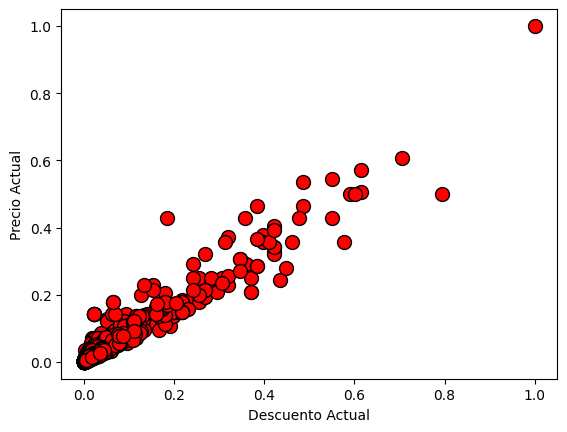

In [4]:
plotData(X, Y)
plt.show()

In [5]:
X = np.stack([np.ones(m), X], axis=1)

In [6]:
def calcularCosto(X, y, theta):
    # inicializa algunos valores importantes
    m = y.size  # numero de ejemplos de entrenamiento

    J = 0
    # h = np.dot(X, theta)
    J = (1/(2 * m)) * np.sum(np.square(np.dot(X, theta) - y))
    return J

In [7]:
def gradientDescent(X, y, theta, alpha, num_iters):
        # Inicializa algunos valores importantes
    m = y.shape[0]  # numero de ejemplos de entrenamiento

    # hace una copia de theta, para evitar cambiar la matriz original,
    # ya que las matrices numpy se pasan por referencia a las funciones

    theta = theta.copy()

    J_history = [] # Lista que se utiliza para almacenar el costo en cada iteración

    for i in range(num_iters):
        theta = theta - (alpha / m) * (np.dot(X, theta) - y).dot(X)
        # save the cost J in every iteration
        J_history.append(calcularCosto(X, y, theta))

    return theta, J_history

In [8]:
# inicializa los parametros de ajuste
theta = np.zeros(2)

# configuraciones para el descenso por el gradiente
iterations = 500000
alpha = 0.001

#numero de capas de regresiones
num_capas = 3

theta, J_history = gradientDescent(X , Y, theta, alpha, iterations)
print('Theta encontrada por descenso gradiente: {:.4f}, {:.4f}'.format(*theta))
print(J_history)

Theta encontrada por descenso gradiente: 0.0059, 0.8237
[np.float64(0.0037749610662669137), np.float64(0.003773382651147916), np.float64(0.003771807308927862), np.float64(0.0037702350334554713), np.float64(0.0037686658185917803), np.float64(0.0037670996582101182), np.float64(0.0037655365461960796), np.float64(0.0037639764764475035), np.float64(0.003762419442874446), np.float64(0.0037608654393991537), np.float64(0.0037593144599560487), np.float64(0.0037577664984916924), np.float64(0.003756221548964768), np.float64(0.003754679605346054), np.float64(0.0037531406616184036), np.float64(0.0037516047117767152), np.float64(0.0037500717498279127), np.float64(0.0037485417697909165), np.float64(0.0037470147656966267), np.float64(0.00374549073158789), np.float64(0.0037439696615194844), np.float64(0.0037424515495580912), np.float64(0.0037409363897822697), np.float64(0.0037394241762824377), np.float64(0.003737914903160843), np.float64(0.0037364085645315436), np.float64(0.0037349051545203815), np.flo

Text(0, 0.5, 'Costo J')

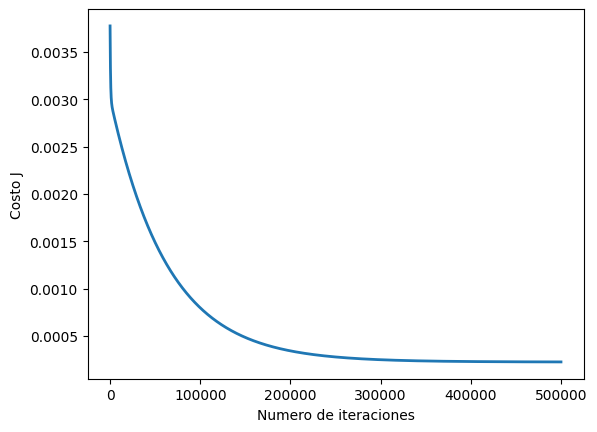

In [9]:
# Grafica la convergencia del costo
plt.plot(np.arange(len(J_history)), J_history, lw=2)
plt.xlabel('Numero de iteraciones')
plt.ylabel('Costo J')

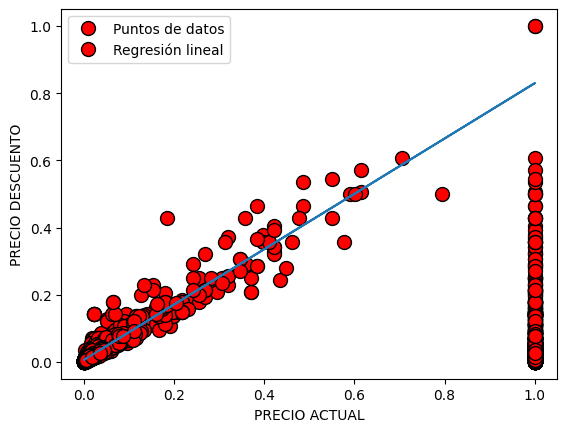

In [10]:
# Grafica la convergencia del costo
plt.plot(X, Y, 'ro', ms=10, mec='k')
plt.xlabel('PRECIO ACTUAL')
plt.ylabel('PRECIO DESCUENTO')
plt.plot(X[:, 1], np.dot(X, theta), '-')
plt.legend(['Puntos de datos', 'Regresión lineal']);

In [14]:
# -------------------------
# Modelo de neurona lineal
# -------------------------
def neurona_lineal(x, theta):
    """
    x: matriz de entradas con columna de 1 para bias
    theta: vector de pesos
    devuelve la salida de la neurona
    """
    return np.dot(x, theta)


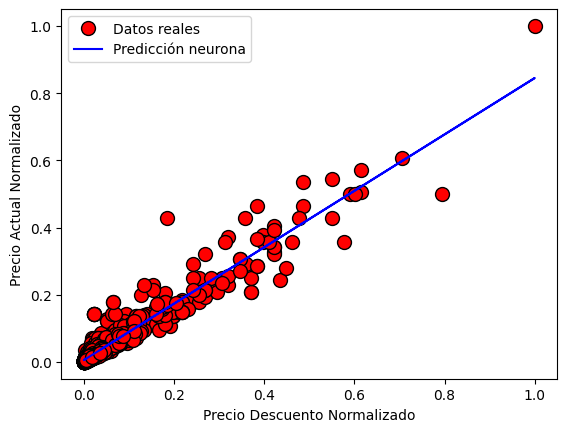

In [15]:
# Predicciones usando la neurona
y_pred = neurona_lineal(X, theta)

# Comparar gráficamente con los datos reales
plt.figure()
plt.plot(X[:,1], Y, 'ro', ms=10, mec='k')
plt.plot(X[:,1], y_pred, '-b')
plt.xlabel('Precio Descuento Normalizado')
plt.ylabel('Precio Actual Normalizado')
plt.legend(['Datos reales', 'Predicción neurona'])
plt.show()
